In [3]:
import sys
from IPython.display import display, Javascript

def restart_kernel():
    """Restart the Jupyter Notebook kernel to reflect changes in modules and packages."""
    display(Javascript("Jupyter.notebook.kernel.restart()"))
    print("Kernel is restarting...")

restart_kernel()

import bptf
from bptf import BPTF
import numpy as np
import pandas as pd
import sparse
import os
import shutil
from tqdm import tqdm
import pickle
import scipy.stats as st
import matplotlib.pyplot as plt
import torch
import tensorly
import cupy

import multiprocessing
from joblib import Parallel, delayed
from tqdm.contrib.concurrent import process_map

import gc
gc.collect()

<IPython.core.display.Javascript object>

Kernel is restarting...


0

In [4]:
os.getcwd()
# tensorly.set_backend('pytorch')

'/home/luiyusen/projects/bptf_new'

# Get reference label tables

In [ ]:
parallel = True
if parallel:
    print(multiprocessing.cpu_count())
# choose the version you want
end_year = 24 # 24 for year 2024, 18 for 2018

folder = "/icews_gdelt_terrier/"
data_filepath = os.getcwd() + folder
files = os.listdir(data_filepath)
if parallel:
    files = Parallel(n_jobs=multiprocessing.cpu_count())(
        delayed(pd.read_csv)(data_filepath + filepath)
        for filepath in tqdm(files, desc = 'Reading data')
    )
    data = pd.concat(files)
else:
    # for filepath in tqdm(files, desc = 'Reading data'):
    #     complete_filepath = data_filepath + filepath
    #     file = pd.read_csv(complete_filepath)
    #     if filepath == files[0]:
    #         data = file
    #     else:
    #         data = pd.concat([data, file])
    #     del file
    data = [pd.read_csv(data_filepath + filepath) for filepath in tqdm(files, desc = 'Reading data')]
    data = pd.concat(data)
    data = data.sort_values(by='Num_Events', ascending=False)

gdelt_filepaths = [os.path.join('GDELT', f) for f in os.listdir('GDELT')]

def read_gdelt(filepath):
    gdelt = pd.read_csv(filepath, dtype={'EventBaseCode': str})
    colnames = data.columns
    gdelt = gdelt.rename(columns={'Actor1CountryCode' : colnames[0],
                                'Actor2CountryCode' : colnames[1],
                                'EventBaseCode' : colnames[2],
                                'SQLDATE' : colnames[3],
                                'NumMentions' : colnames[4]})
    gdelt = gdelt[gdelt['CAMEO_Code'].str.isnumeric()]
    gdelt['CAMEO_Code'] = gdelt['CAMEO_Code'].astype(int)
    gdelt['formatteddate'] = pd.to_datetime(gdelt['formatteddate'], format='%Y%m%d')
    gdelt['formatteddate'] = gdelt['formatteddate'].dt.strftime('%Y-%m-%d')
    return gdelt

if parallel:
    if __name__ == '__main__':
        gdelt = Parallel(n_jobs = multiprocessing.cpu_count())(
            delayed(read_gdelt)(gdelt_filepath)
            for gdelt_filepath in tqdm(gdelt_filepaths, desc='Reading GDELT data')
            )
else:
    gdelt = [read_gdelt(gdelt_filepath) for gdelt_filepath in tqdm(gdelt_filepaths, desc='Reading GDELT data')]

gdelt = pd.concat(gdelt)

gdelt['Database'] = 'GDELT'
data = pd.concat([data, gdelt])
print(data.head())
print(data.tail())
del gdelt
gc.collect()

years = [str(2000 + x) for x in range(0, 25)]
data = data[data['formatteddate'].str.startswith(tuple(years))]

# collapse by month
data['formatteddate'] = data['formatteddate'].str[:7]
data = data.groupby(['Source_Country_Code', 'Target_Country_Code', 'CAMEO_Code', 'formatteddate', 'Database'])
data = data.sum().reset_index()

# Make the list of countries, actions, times and databases ========================================
# get unique list of countries
countries = pd.concat([data['Source_Country_Code'], data['Target_Country_Code']])
countries = pd.unique(countries)
country_indices = pd.DataFrame({
    'country' : countries,
    'index' : range(len(countries))
})
del countries

# there's no need to get a list of actions since it's just 1 to 20

# get unique list of dates
# Make sure to change the date format and frequency of the date range if you change the time unit
date_indices = pd.date_range(
    start=pd.to_datetime(data['formatteddate'], format='%Y-%m').min().strftime('%Y-%m'), 
    end=pd.to_datetime(data['formatteddate'], format='%Y-%m').max().strftime('%Y-%m'),
    freq='MS')
date_indices = date_indices.strftime('%Y-%m').to_list()
date_indices = pd.DataFrame({
    'date' : date_indices,
    'index' : range(len(date_indices))
})
date_indices['date'] = date_indices['date'].str[:7]

# get unique list of databases
databases = pd.unique(data['Database'])
databases = pd.unique(databases)
database_indices = pd.DataFrame({
    'database' : databases,
    'index' : range(len(databases))
})
print(database_indices)
del databases

64


Reading data:   0%|          | 0/103 [00:00<?, ?it/s]

Reading GDELT data: 100%|██████████| 21/21 [00:00<00:00, 17206.56it/s]


  Source_Country_Code Target_Country_Code  CAMEO_Code formatteddate  \
0                 NaN                 NaN           1    1980-08-16   
1                 NGO                 NaN           1    1982-11-26   
2                 NIC                 NaN           1    1985-04-11   
3                 SUN                 NaN           1    1986-05-24   
4                 ZMB                 NaN           1    1988-03-13   

   Num_Events Database  
0           1  TERRIER  
1           1  TERRIER  
2           1  TERRIER  
3           1  TERRIER  
4           1  TERRIER  
       Source_Country_Code Target_Country_Code  CAMEO_Code formatteddate  \
341761                 ZWE                 GNQ           5    2008-01-31   
341762                 ZWE                 GNQ          17    2008-01-31   
341763                 ZWE                 GNQ          17    2008-01-31   
341764                 ZWE                 AFR          17    2008-01-31   
341765                 ZWE                 

# Get tensor

In [ ]:
with open('sptensor.pkl', 'rb') as f:
    Y = pickle.load(f)

# Tensor factorisation

In [ ]:
# decompose the tensor using Poisson CP decomposition
gc.collect()
n_components = 100

bptf_filepath = f'bptf_5mode_50iter_2000_20{end_year}.pkl'

if os.path.exists(bptf_filepath):
    with open(bptf_filepath, 'rb') as f:
        bptf_5mode = pickle.load(f)
else:
    print(f'{bptf_filepath} does not exist!')

# Checks

In [19]:
# check the shapes
for j in range(len(Y.shape)):
    assert bptf_5mode.G_DK_M[j].shape == (Y.shape[j], n_components)

# Reconstruction

In [21]:
Y_hat = bptf_5mode.reconstruct()
Y_original = Y.todense()

# print(Y_hat[:5, :5, 0, 0, 0]); print(Y[:5, :5, 0, 0, 0].todense())
print(Y[:5, :5, 0, 0, 0].todense() - Y_hat[:5, :5, 0, 0, 0])

[[-1.64334517e-04 -4.73437944e-05 -1.23203864e-04 -1.33597374e-03
  -5.20645182e-05]
 [-1.61117447e-05  1.54776867e+01 -6.99917782e-03 -6.22923657e-03
  -5.47953138e-06]
 [-6.92580130e-05 -4.01110049e-03 -6.14672118e-01 -4.31863136e-01
  -1.98356535e-05]
 [-5.32505153e-04 -4.94455501e-03 -4.51056094e-01  1.64875725e+01
  -4.60288887e-05]
 [-4.29273749e-05 -1.66556479e-05 -3.19420265e-05 -3.70567392e-05
   9.99982317e-01]]


# Compare with Tensorly's CP decomposition

### 2-norm error

In [ ]:
if os.path.exists('nntf_parafac_5mode.pkl'):
    with open('nntf_parafac_5mode.pkl', 'rb') as f:
        tensor_mu = pickle.load(f)
else:
    cp_init = tensorly.cp_tensor.CPTensor(
        tensorly.decomposition._cp.initialize_cp(
            Y, non_negative = True, init = 'random', rank = n_components
            )
        )
    tensor_mu, _ = tensorly.decomposition.non_negative_parafac(
        Y, rank=n_components, init=cp_init, return_errors=True
        )
    
    with open('nntf_parafac_5mode.pkl', 'wb') as f:
        pickle.dump(tensor_mu, f)

In [ ]:
print(torch.norm(torch.from_numpy(Y.todense()) - torch.from_numpy(tensorly.cp_to_tensor(tensor_mu)), 'fro') / 
      torch.norm(torch.from_numpy(Y.todense()), 'fro'))
print(torch.norm(torch.from_numpy(Y.todense()) - bptf_5mode.reconstruct(drop_diag=True, style='geometric', n_samples=100), 'fro') / 
      torch.norm(torch.from_numpy(Y.todense()), 'fro'))
# it's pretty close to tensorly's implementation when using frobenius norm forward error

tensor(0.2377, dtype=torch.float64)


C:\Users\luiyu\AppData\Local\Temp\ipykernel_28712\3844550198.py:3: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  print(torch.norm(torch.from_numpy(Y.todense()) - bptf_5mode.reconstruct(drop_diag=True, style='geometric', n_samples=100), 'fro') /


tensor(0.9682, dtype=torch.float64)


### Comparing non-zero element prediction accuracy

In [22]:
nonzero_indices = np.vstack(sparse.nonzero(Y)).T.tolist()
nonzero_indices = [tuple(ele) for ele in nonzero_indices]

largest_indices = np.argpartition(Y_hat.ravel(), -Y.nnz)[-Y.nnz:]
largest_indices = np.unravel_index(largest_indices, Y_hat.shape)
largest_indices = np.vstack(largest_indices).T.tolist()
largest_indices = [tuple(ele) for ele in largest_indices]
num_correct_predictions_BPTF = len(set(nonzero_indices) & set(largest_indices))
print(f'Proportion of nonzero elements correctly predicted by BPTF: {num_correct_predictions_BPTF / Y.nnz}')

Proportion of nonzero elements correctly predicted by BPTF: 0.5052235049423731


In [ ]:
largest_indices = np.argpartition(tensorly.cp_to_tensor(tensor_mu).ravel(), -Y.nnz)[-Y.nnz:]
largest_indices = np.unravel_index(largest_indices, tensorly.cp_to_tensor(tensor_mu).shape)
largest_indices = np.vstack(largest_indices).T.tolist()
largest_indices = [tuple(ele) for ele in largest_indices]
num_correct_predictions_NNCP = len(set(nonzero_indices) & set(largest_indices))

In [ ]:
print(f'Proportion of nonzero elements correctly predicted by BPTF: {num_correct_predictions_BPTF / Y.nnz}')
print(f'Proportion of nonzero elements correctly predicted by tensorly nonnegative CP decomposition: {num_correct_predictions_NNCP / Y.nnz}')

Proportion of nonzero elements correctly predicted by BPTF: 0.6372704658237569
Proportion of nonzero elements correctly predicted by tensorly nonnegative CP decomposition: 0.6004870907261741


# Plot components

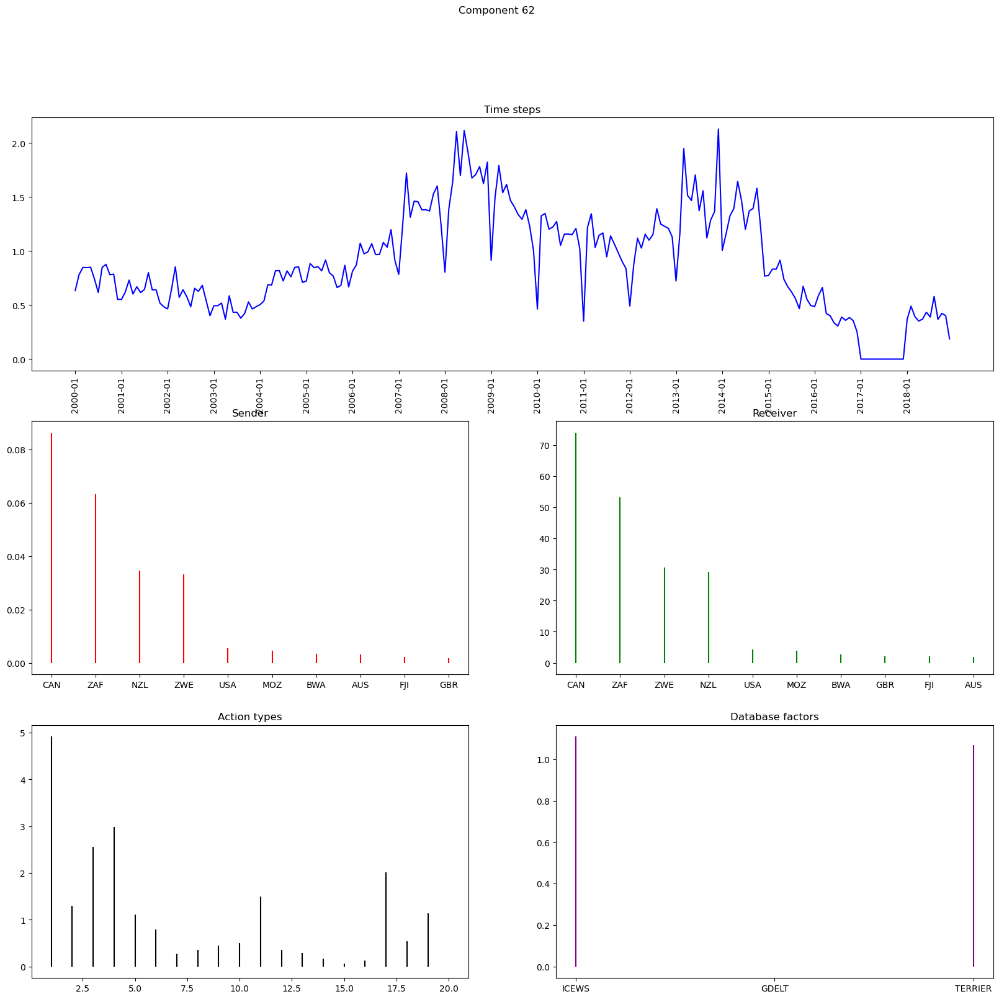

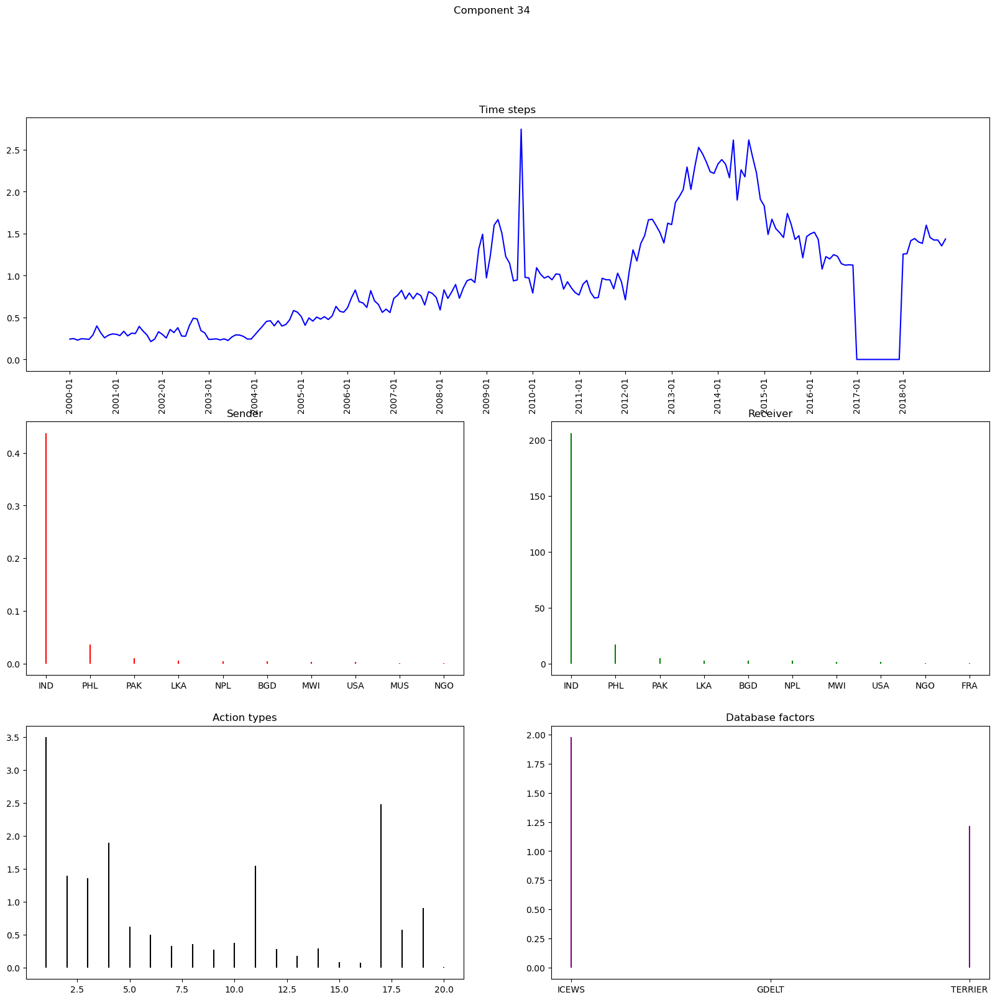

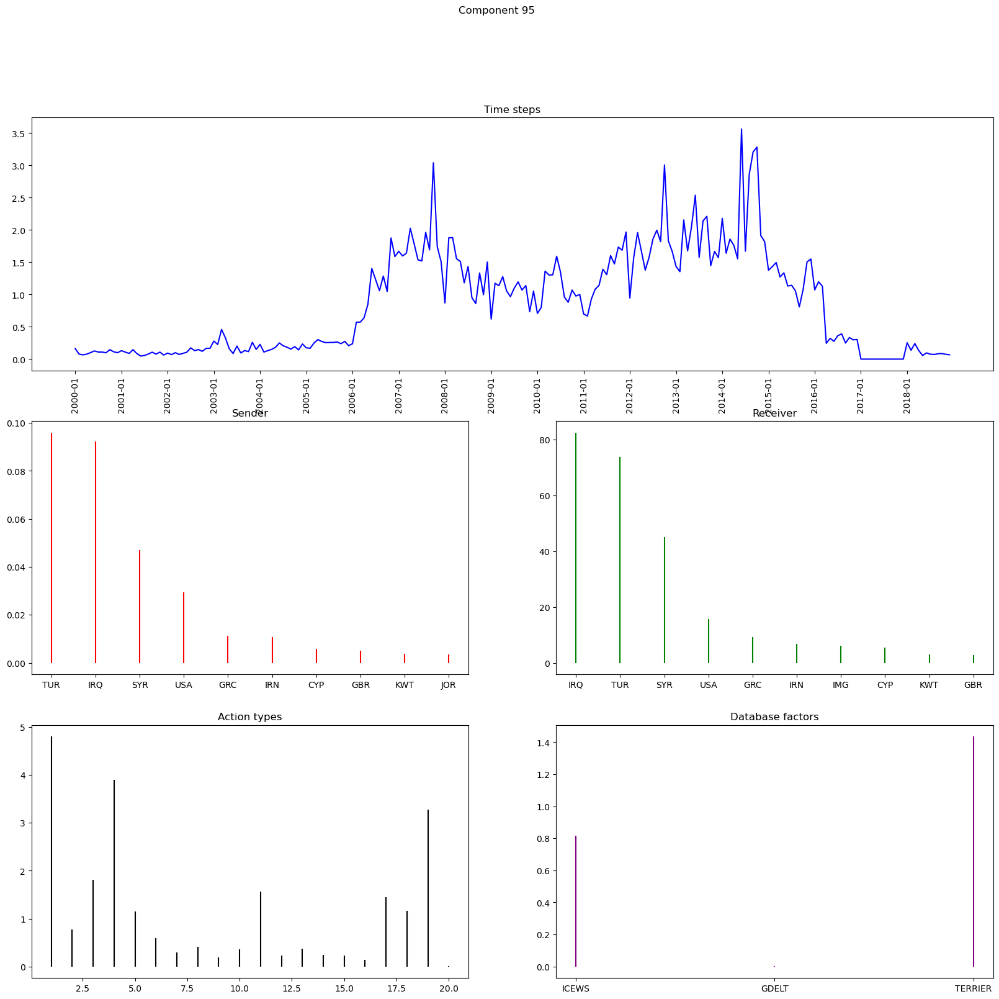

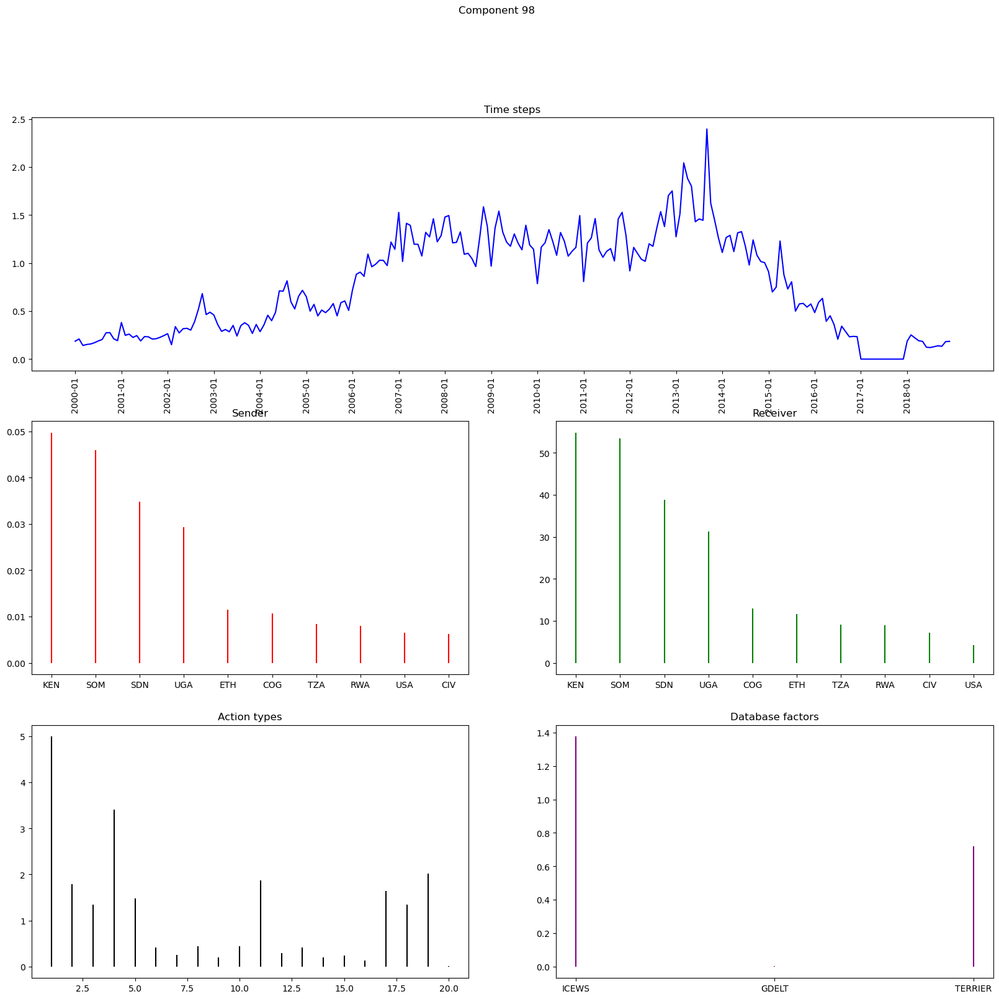

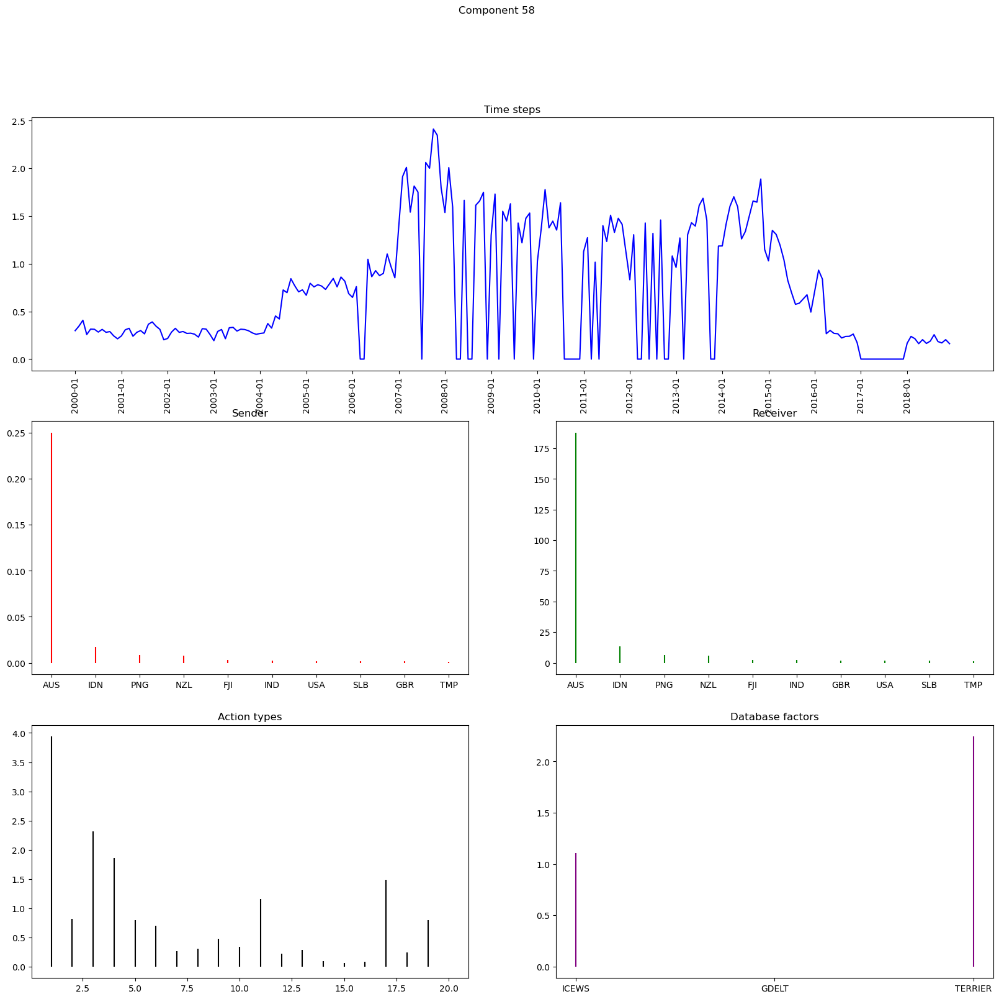

...

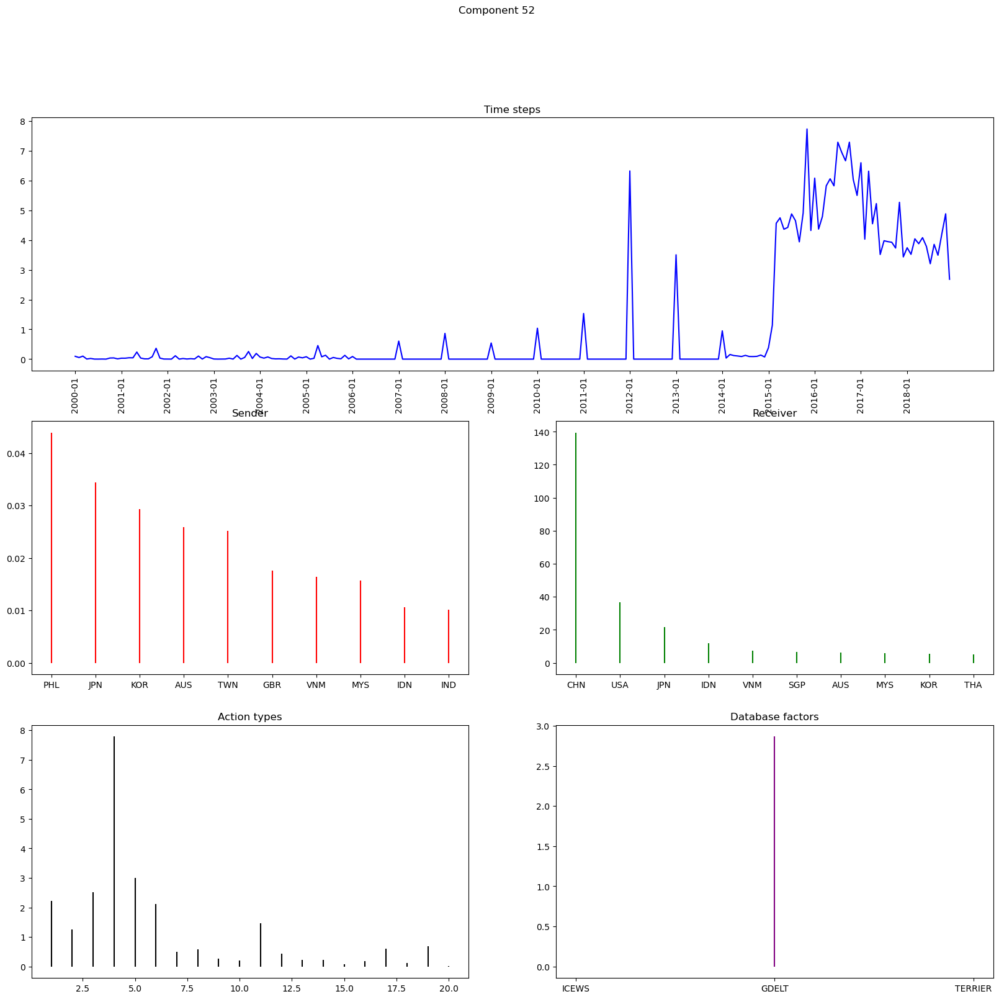

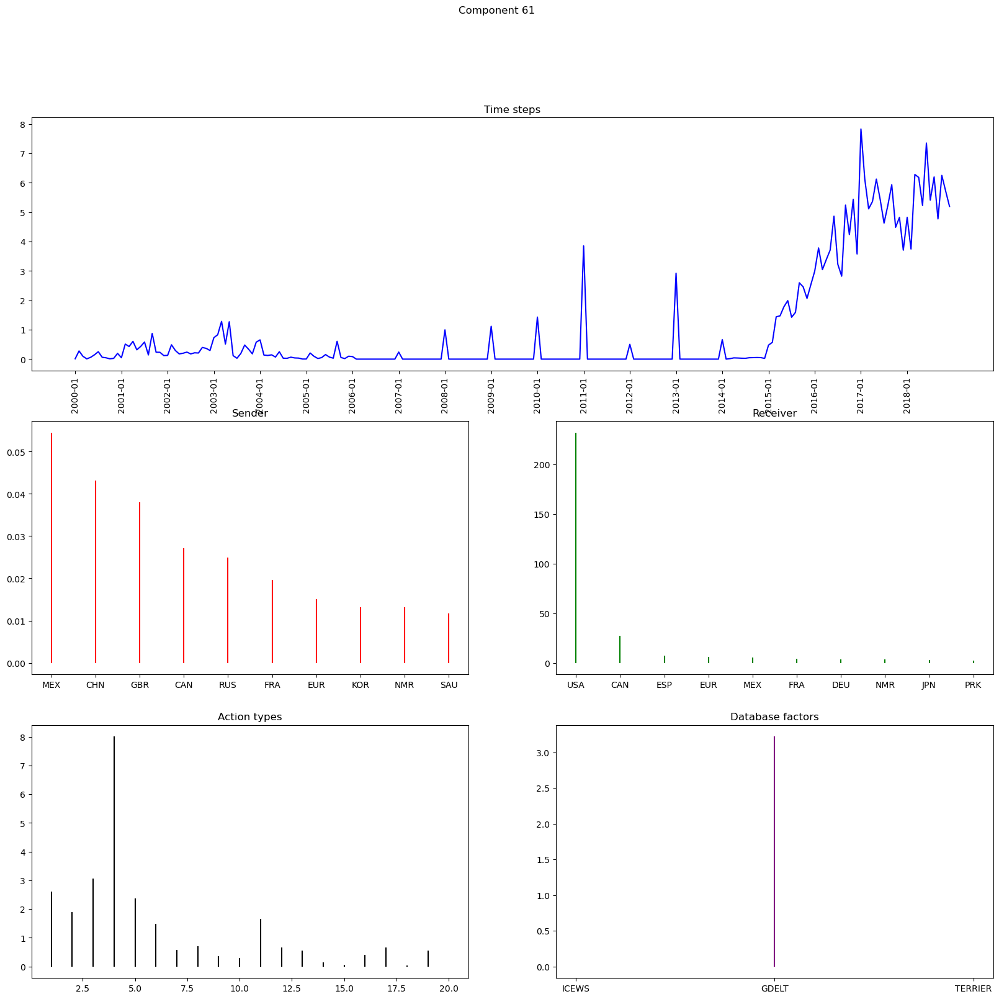

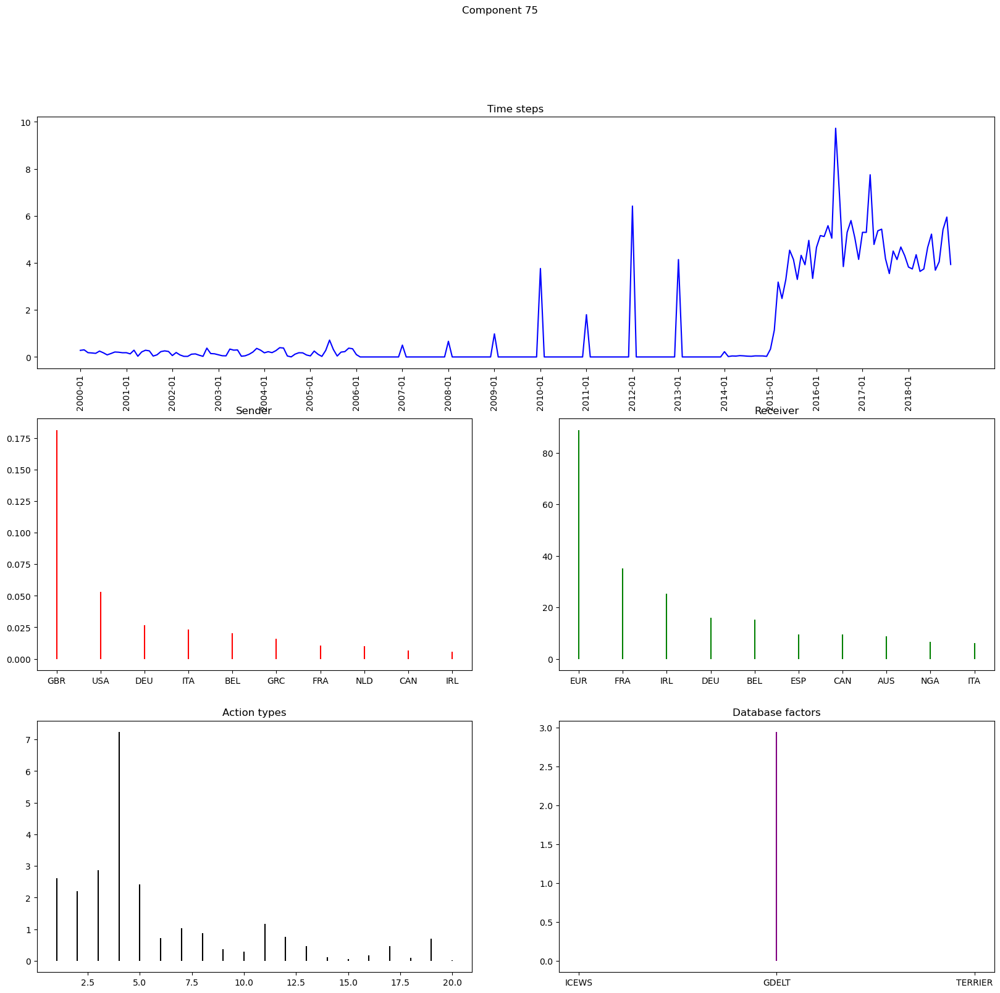

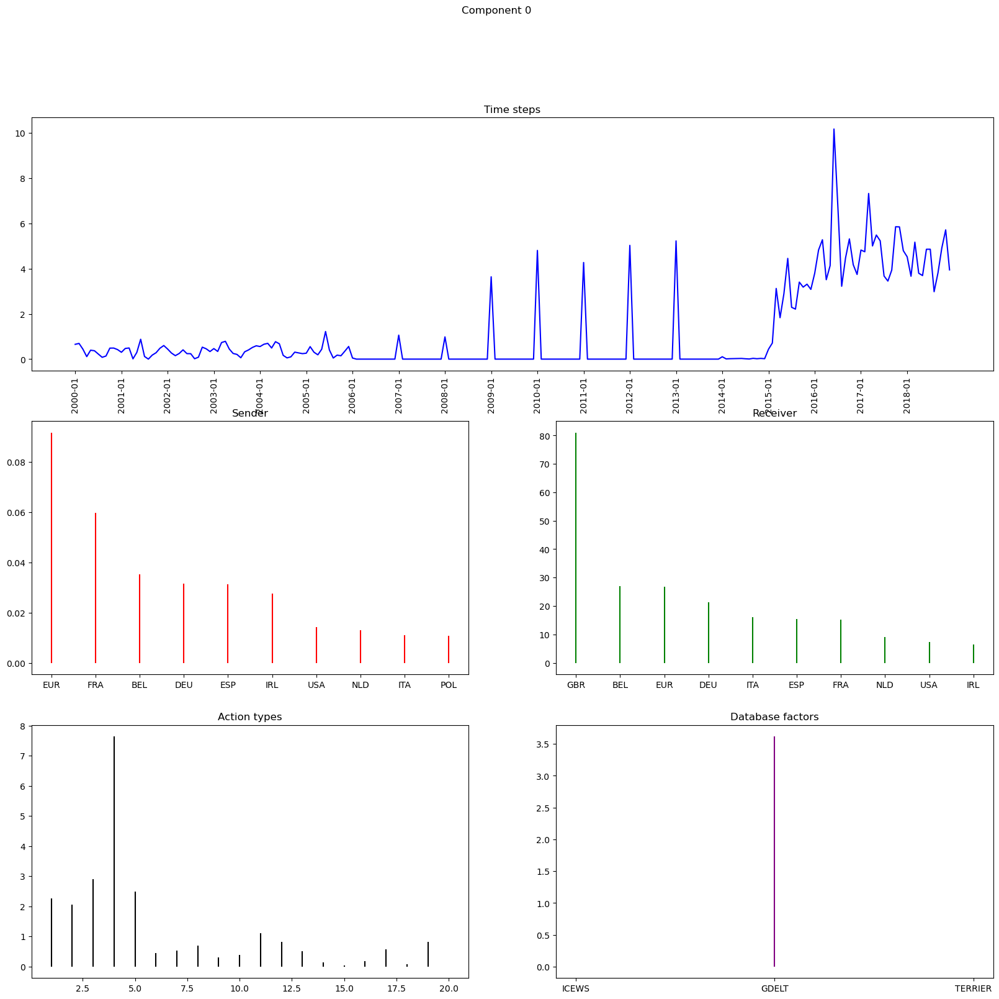

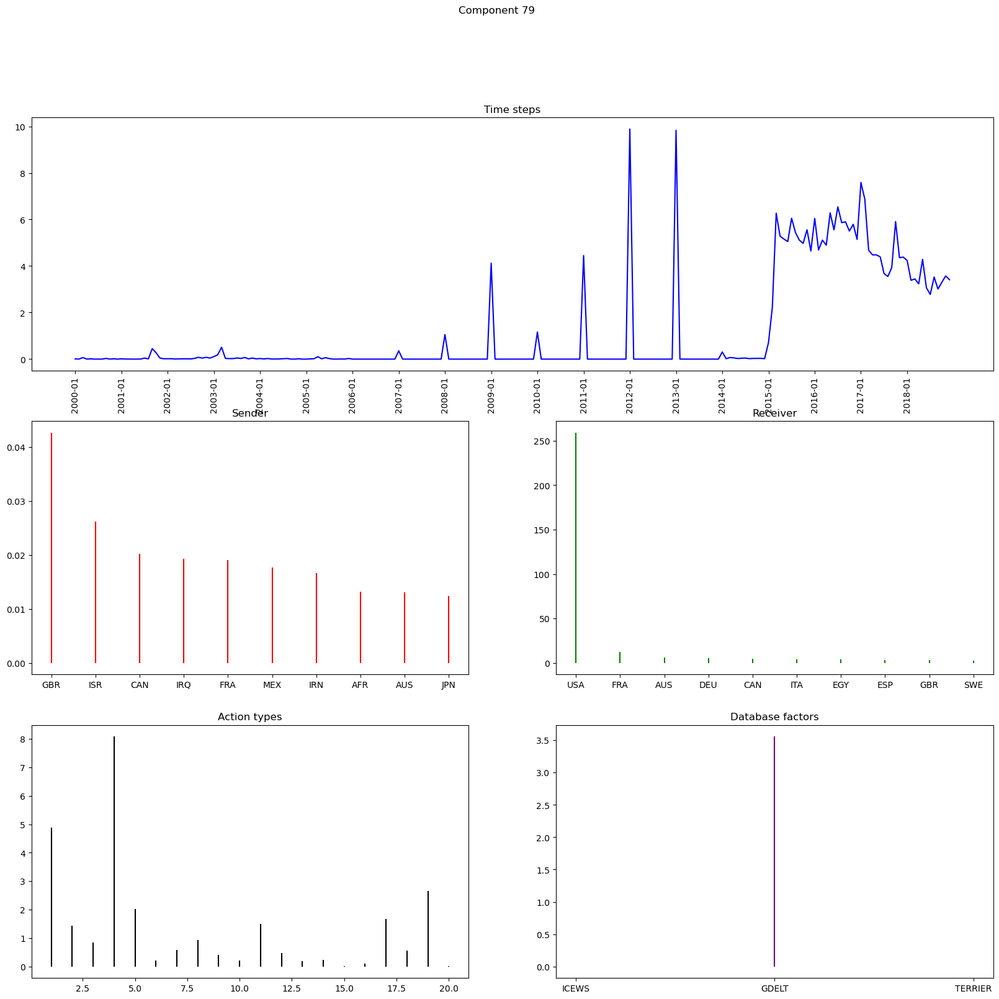

In [23]:
database_factor_matrix = bptf_5mode.G_DK_M[4]
database_factor_matrix = database_factor_matrix/database_factor_matrix.sum(axis=0,keepdims=1)
database_entropy = st.entropy(database_factor_matrix, axis=0)
database_components = pd.DataFrame({
    'ICEWS' : database_factor_matrix[0, :],
    'TERRIER' : database_factor_matrix[1, :],
    'GDELT' : database_factor_matrix[2, :],
    'entropy' : database_entropy,
    'index' : range(n_components)
}).sort_values(by='entropy', ascending=False)

def component_analysis_plot(component):

    fig = plt.figure(figsize=(20, 18))
    gs = fig.add_gridspec(3, 2, height_ratios=[1, 1, 1])

    ax1 = fig.add_subplot(gs[0, :])
    time_vector = bptf_5mode.G_DK_M[3][:, component]
    time_vector = pd.DataFrame({
        'time steps' : time_vector,
        'index' : range(time_vector.shape[0])
    })
    time_vector = pd.merge(
        left=time_vector, right=date_indices,
        how='left', on='index'
    )
    ax1.plot(time_vector['date'], time_vector['time steps'], color='b')
    ticks = ax1.get_xticks()[::12]
    ax1.set_xticks(ticks)
    ax1.tick_params(axis='x', rotation=90)
    ax1.set_title('Time steps')

    ax2 = fig.add_subplot(gs[1, 0])
    sender_vector = bptf_5mode.G_DK_M[0][:, component]
    sender_vector = pd.DataFrame({
        'sender' : sender_vector,
        'index' : range(sender_vector.shape[0])})
    sender_vector = pd.merge(
        left=sender_vector, right=country_indices,
        how='left', on='index'
    ).sort_values(
        by='sender', 
        ascending=False).iloc[:10, :]
    ax2.vlines(x=sender_vector['country'], ymin=0, ymax=sender_vector['sender'], color='r')
    ax2.set_title('Sender')

    ax3 = fig.add_subplot(gs[1, 1])
    receiver_vector = bptf_5mode.G_DK_M[1][:, component]
    receiver_vector = pd.DataFrame({
        'receiver' : receiver_vector,
        'index' : range(receiver_vector.shape[0])})
    receiver_vector = pd.merge(
        left=receiver_vector, right=country_indices,
        how='left', on='index'
    ).sort_values(
        by='receiver', ascending=False
    ).iloc[:10, :]
    ax3.vlines(x=receiver_vector['country'], ymin=0, ymax=receiver_vector['receiver'], color='g')
    ax3.set_title('Receiver')

    ax4 = fig.add_subplot(gs[2, 0])
    action_vector = bptf_5mode.G_DK_M[2][:, component]
    action_vector = pd.DataFrame({
        'action' : action_vector,
        'action type' : range(1, 21)
    })
    ax4.vlines(x=action_vector['action type'], ymin=0, ymax=action_vector['action'], color='black')
    ax4.set_title('Action types')

    ax5 = fig.add_subplot(gs[2, 1])
    database_vector = bptf_5mode.G_DK_M[4][:, component]
    database_vector = pd.DataFrame({
        'factor' : database_vector,
        'index' : range(database_vector.shape[0])
    })
    database_vector = pd.merge(
        left=database_vector, right=database_indices,
        how='left', on='index'
    )
    ax5.vlines(x=database_vector['database'], ymin=0, ymax=database_vector['factor'], color='purple')
    ax5.set_title('Database factors')

    fig.suptitle('Component ' + str(component))

    plt.show()

for component in database_components['index']:
    component_analysis_plot(component)